In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from googleapiclient.discovery import build
import requests
from bs4 import BeautifulSoup
import re
import math
import time

O que fazer:
* pega a data de lançamento de musicas no spotify, fazer isso em duas partes
* ver a duração das musicas de milisegundos para minutos, e ver se tem ouliers
* ver a relação das features com o engajamento
* repegar os artistas da musica

# Entrada de dados

In [3]:
spotify_youtube_pt1 = pd.read_csv("Dados/spotify_youtube_up_pt1.csv")
spotify_youtube_pt2 = pd.read_csv("Dados/spotify_youtube_up_pt2.csv")

In [4]:
data_extracao = pd.to_datetime("2023-02-07")
spotify_youtube_pt1["upload_date"] = pd.to_datetime(spotify_youtube_pt1["upload_date"])
spotify_youtube_pt1["dias_na_plataforma"] = (data_extracao - spotify_youtube_pt1["upload_date"]).dt.days

spotify_youtube_pt2["upload_date"] = pd.to_datetime(spotify_youtube_pt2["upload_date"])
spotify_youtube_pt2["dias_na_plataforma"] = (data_extracao - spotify_youtube_pt2["upload_date"]).dt.days

In [5]:
spotify_youtube = pd.concat([spotify_youtube_pt1,spotify_youtube_pt2])

In [50]:
spotify_youtube.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15610 entries, 0 to 7789
Data columns (total 30 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Unnamed: 0          15610 non-null  int64         
 1   Artist              15610 non-null  object        
 2   Url_spotify         15610 non-null  object        
 3   Track               15610 non-null  object        
 4   Album               15610 non-null  object        
 5   Album_type          15610 non-null  object        
 6   Uri                 15610 non-null  object        
 7   Danceability        15609 non-null  float64       
 8   Energy              15609 non-null  float64       
 9   Key                 15609 non-null  float64       
 10  Loudness            15609 non-null  float64       
 11  Speechiness         15609 non-null  float64       
 12  Acousticness        15609 non-null  float64       
 13  Instrumentalness    15609 non-null  float64       
 

In [51]:
spotify_youtube.columns

Index(['Unnamed: 0', 'Artist', 'Url_spotify', 'Track', 'Album', 'Album_type',
       'Uri', 'Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness',
       'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
       'Duration_ms', 'Url_youtube', 'Title', 'Channel', 'Views', 'Likes',
       'Comments', 'Description', 'Licensed', 'official_video', 'Stream',
       'upload_date', 'dias_na_plataforma'],
      dtype='object')

In [6]:
print(f'numeros de musicas com 30 dias ou menos de existencia: {len(spotify_youtube[spotify_youtube['dias_na_plataforma']<31])}')
print(f'numeros de musicas com 90 dias ou menos de existencia: {len(spotify_youtube[spotify_youtube['dias_na_plataforma']<91])}')
print(f'numeros de musicas com 365 dias ou menos de existencia: {len(spotify_youtube[spotify_youtube['dias_na_plataforma']<365])}')

numeros de musicas com 30 dias ou menos de existencia: 322
numeros de musicas com 90 dias ou menos de existencia: 1107
numeros de musicas com 365 dias ou menos de existencia: 3379


In [7]:
spotify_df=spotify_youtube[['Artist', 'Url_spotify', 'Track', 'Album', 'Album_type','Uri', 'Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms','Stream','upload_date','dias_na_plataforma']]
spotify_df=spotify_df.reset_index()

In [54]:
spotify_df.head(5)

,index,Artist,Url_spotify,Track,Album,Album_type,Uri,Danceability,Energy,Key,...,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Stream,upload_date,dias_na_plataforma
0,0,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Feel Good Inc.,Demon Days,album,spotify:track:0d28khcov6AiegSCpG5TuT,0.818,0.705,6.0,...,0.1770,0.008360,0.002330,0.6130,0.772,138.559,222640.0,1.040235e+09,2016-06-28 12:53:12,2414
1,1,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Rhinestone Eyes,Plastic Beach,album,spotify:track:1foMv2HQwfQ2vntFf9HFeG,0.676,0.703,8.0,...,0.0302,0.086900,0.000687,0.0463,0.852,92.761,200173.0,3.100837e+08,2010-10-04 12:13:08,4508
2,2,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,New Gold (feat. Tame Impala and Bootie Brown),New Gold (feat. Tame Impala and Bootie Brown),single,spotify:track:64dLd6rVqDLtkXFYrEUHIU,0.695,0.923,1.0,...,0.0522,0.042500,0.046900,0.1160,0.551,108.014,215150.0,6.306347e+07,2022-08-31 17:21:40,159
3,3,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,On Melancholy Hill,Plastic Beach,album,spotify:track:0q6LuUqGLUiCPP1cbdwFs3,0.689,0.739,2.0,...,0.0260,0.000015,0.509000,0.0640,0.578,120.423,233867.0,4.346636e+08,2010-06-14 08:36:39,4620
4,4,Gorillaz,https://open.spotify.com/artist/3AA28KZvwAUcZu...,Clint Eastwood,Gorillaz,album,spotify:track:7yMiX7n9SBvadzox8T5jzT,0.663,0.694,10.0,...,0.1710,0.025300,0.000000,0.0698,0.525,167.953,340920.0,6.172597e+08,2016-06-28 12:18:36,2414


In [55]:
spotify_df["Duration_min"] = spotify_df["Duration_ms"] / 60000

In [8]:
spotify_data_df=spotify_df[spotify_df['dias_na_plataforma']<400]

In [79]:
spotify_taken_df = pd.read_csv("spotify_data_df.csv")

In [80]:
len(spotify_taken_df)

1107

In [67]:
spotify_taken_df.columns

Index(['index', 'Artist', 'Url_spotify', 'Track', 'Album', 'Album_type', 'Uri',
       'Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness',
       'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
       'Duration_ms', 'Stream', 'upload_date', 'dias_na_plataforma',
       'Duration_min', 'spotify_upload'],
      dtype='object')

In [82]:
spotify_data_df["upload_date"] = pd.to_datetime(spotify_data_df["upload_date"])
spotify_taken_df["upload_date"] = pd.to_datetime(spotify_taken_df["upload_date"])

C:\Users\Samsung\AppData\Local\Temp\ipykernel_21032\3055370306.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spotify_data_df["upload_date"] = pd.to_datetime(spotify_data_df["upload_date"])


In [83]:
spotify_data_df = spotify_data_df.merge(
    spotify_taken_df[["index"]],  # Mantém apenas a coluna "index" no sub_df
    how="left",
    on="index",
    indicator=True
).query('_merge == "left_only"').drop(columns=["_merge"])

In [ ]:
spotify_data_df

In [84]:
len(spotify_data_df)

2153

In [10]:
metade = math.ceil(len(spotify_data_df) // 2 )
spotify_data_pt1 = spotify_data_df.iloc[:metade]  
spotify_data_pt2 = spotify_data_df.iloc[metade:]  

In [12]:
len(spotify_data_pt2)

1768

C:\Users\Samsung\AppData\Local\Temp\ipykernel_21032\2273800022.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spotify_data_pt3['spotify_upload']=spotify_uploads


In [92]:
#spotify_data_df = pd.read_csv("spotify_data_df.csv")

In [93]:
spotify_data_pt3["spotify_upload"] = spotify_data_pt3["spotify_upload"].astype(str)
spotify_data_pt3.loc[spotify_data_pt3["spotify_upload"].str.len() == 7, "spotify_upload"] += "-01"
spotify_data_pt3["spotify_upload"] = pd.to_datetime(spotify_data_pt3["spotify_upload"], format="%Y-%m-%d", errors="coerce")
spotify_data_pt3=spotify_data_pt3[spotify_data_pt3["spotify_upload"]!="0000"]
spotify_data_pt3 = spotify_data_pt3.dropna(subset=['spotify_upload'])
spotify_data_pt3["spotify_upload"] = pd.to_datetime(spotify_data_pt3["spotify_upload"])

C:\Users\Samsung\AppData\Local\Temp\ipykernel_21032\26079636.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spotify_data_pt3["spotify_upload"] = spotify_data_pt3["spotify_upload"].astype(str)
C:\Users\Samsung\AppData\Local\Temp\ipykernel_21032\26079636.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spotify_data_pt3["spotify_upload"] = pd.to_datetime(spotify_data_pt3["spotify_upload"], format="%Y-%m-%d", errors="coerce")


In [94]:
data_extracao = pd.to_datetime("2023-02-07")
spotify_data_pt3["dias_na_plataforma_spoity"] = (data_extracao - spotify_data_pt3["spotify_upload"]).dt.days

In [96]:
spotify_data_df[["Track","dias_na_plataforma","dias_na_plataforma_spoity"]]

,Track,dias_na_plataforma,dias_na_plataforma_spoity
0,New Gold (feat. Tame Impala and Bootie Brown) ...,80,81
1,Lux Æterna,70,71
2,Screaming Suicide,18,19
3,TRUSTFALL,10,11
4,Down In Atlanta,80,81
...,...,...,...
1102,Impurities,85,113
1103,SPIT IN MY FACE!,88,49
1104,Keep It Tucked,66,62
1105,CAROLINE,20,27


In [97]:
print(f'numeros de musicas com 30 dias ou menos de existencia: {len(spotify_data_df[spotify_data_df['dias_na_plataforma_spoity']<31])}')
print(f'numeros de musicas com 90 dias ou menos de existencia: {len(spotify_data_df[spotify_data_df['dias_na_plataforma_spoity']<91])}')
print(f'numeros de musicas com 365 dias ou menos de existencia: {len(spotify_data_df[spotify_data_df['dias_na_plataforma_spoity']<365])}')

numeros de musicas com 30 dias ou menos de existencia: 268
numeros de musicas com 90 dias ou menos de existencia: 928
numeros de musicas com 365 dias ou menos de existencia: 1039


In [100]:
spotify_30_df=spotify_data_df[spotify_data_df['dias_na_plataforma_spoity']<46]

In [109]:
spotify_30_df=spotify_30_df[spotify_30_df['index']!=136]

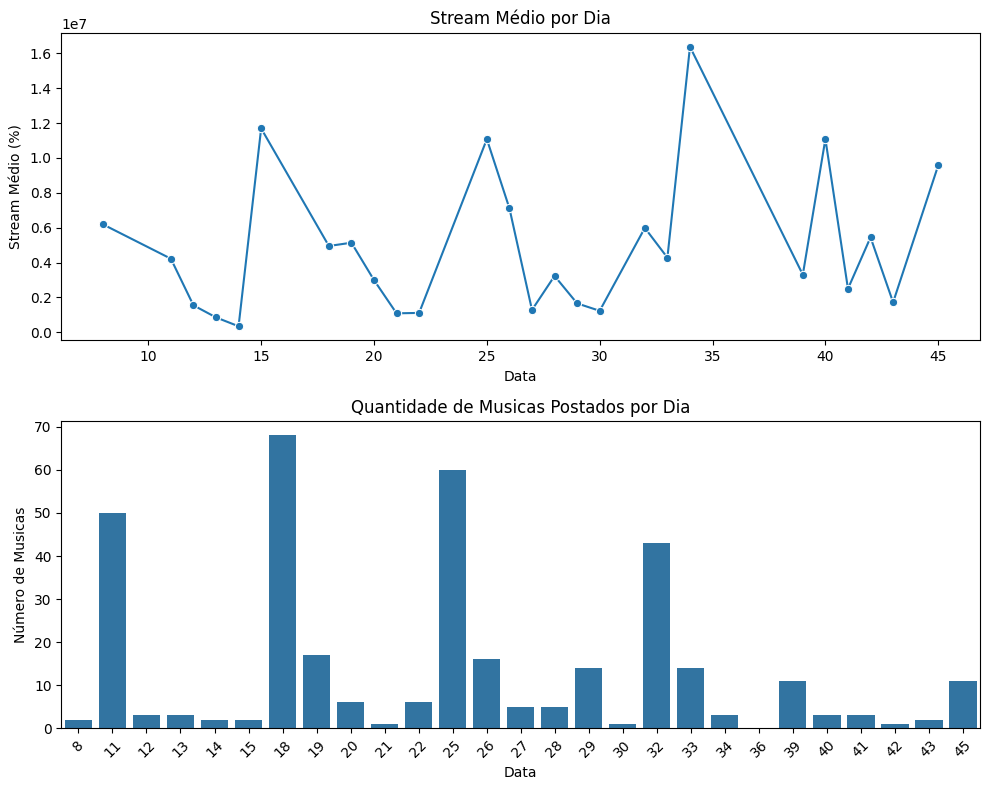

In [110]:
df_grouped = spotify_30_df.groupby('dias_na_plataforma_spoity').agg(
    stream_mean=('Stream', 'mean'), 
    video_count=('Stream', 'count')  # Contando vídeos por dia
).reset_index()
fig, ax1 = plt.subplots(2, 1, figsize=(10, 8)) 

# Gráfico 1: Engajamento médio por dia
sns.lineplot(data=df_grouped, x='dias_na_plataforma_spoity', y='stream_mean', marker='o', ax=ax1[0])
ax1[0].set_title('Stream Médio por Dia')
ax1[0].set_ylabel('Stream Médio (%)')
ax1[0].set_xlabel('Data')

# Gráfico 2: Quantidade de vídeos por dia
sns.barplot(data=df_grouped, x='dias_na_plataforma_spoity', y='video_count', ax=ax1[1])
ax1[1].set_title('Quantidade de Musicas Postados por Dia')
ax1[1].set_ylabel('Número de Musicas')
ax1[1].set_xlabel('Data')

# Ajustar layout
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [15]:
import spotipy
from spotipy.oauth2 import SpotifyOAuth

# Configurar autenticação
sp = spotipy.Spotify(auth_manager=SpotifyOAuth(
    client_id="cb7f3180cd3849aa8d07d8395ea7ce1e",
    client_secret="ccad6bad55454b028d5ab527b1ded739",
    redirect_uri="http://localhost:8888/callback",
    scope="user-read-private user-read-email user-library-read"
))

cache = {}

def get_track_release_date(spotify_uri, delay=0.5):
    """ Obtém a data de lançamento da música, reduzindo a frequência das requisições """
    track_id = spotify_uri.split(":")[-1]  # Extrai o ID da música
    
    # Verifica se já temos a data no cache
    if track_id in cache:
        return cache[track_id]
    
    try:
        track_info = sp.track(track_id)  # Busca detalhes da música
        release_date = track_info["album"]["release_date"]  # Obtém a data de lançamento do álbum
        
        cache[track_id] = release_date  # Salva no cache para evitar chamadas repetidas
        time.sleep(delay)  # Aguarda para evitar limite de requisições
        return release_date
    
    except spotipy.exceptions.SpotifyException as e:
        print(f"Erro ao buscar a música {track_id}: {e}")
        return None



# Exemplo de links de músicas
track_urls = spotify_data_pt2.Uri.to_list()
spotify_uploads=[]


# Buscar datas de lançamento
for url in track_urls:
    spotify_uploads.append(get_track_release_date(url))

spotify_data_pt2['spotify_upload']=spotify_uploads

C:\Users\Samsung\AppData\Local\Temp\ipykernel_20364\642809328.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spotify_data_pt2['spotify_upload']=spotify_uploads


In [16]:
spotify_data_pt2.to_csv("spotify_data_pt2.csv", index=False)

## Graficos

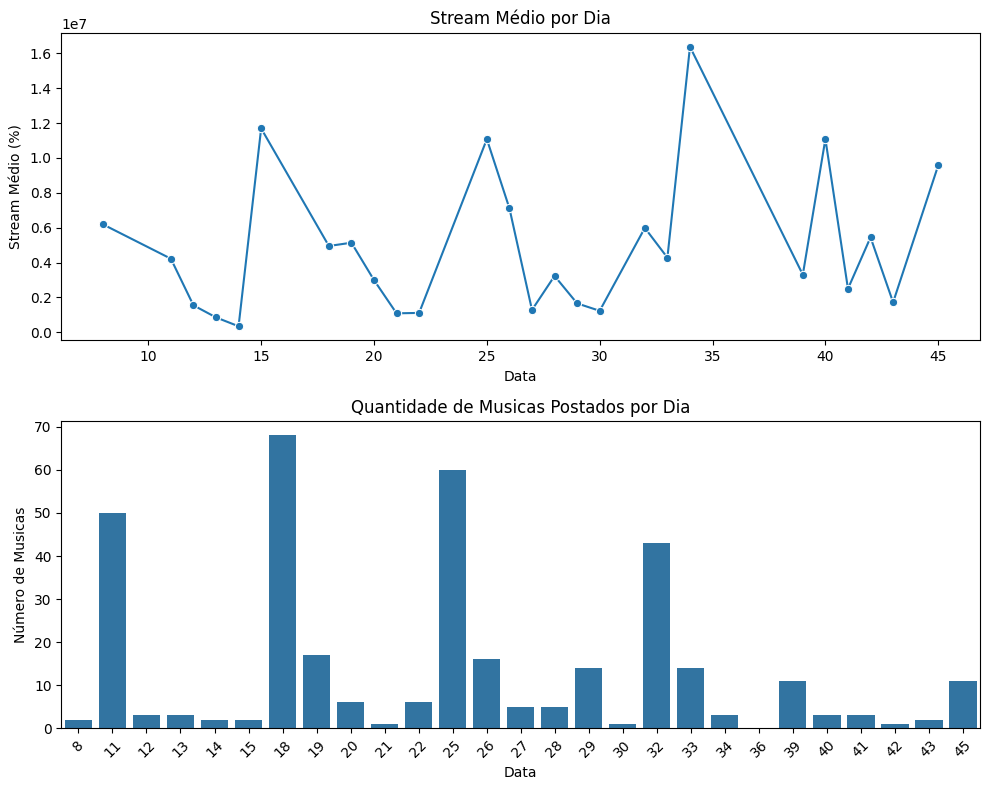

In [111]:
df_grouped = spotify_30_df.groupby('dias_na_plataforma_spoity').agg(
    stream_mean=('Stream', 'mean'), 
    video_count=('Stream', 'count')  # Contando vídeos por dia
).reset_index()
fig, ax1 = plt.subplots(2, 1, figsize=(10, 8)) 

# Gráfico 1: Engajamento médio por dia
sns.lineplot(data=df_grouped, x='dias_na_plataforma_spoity', y='stream_mean', marker='o', ax=ax1[0])
ax1[0].set_title('Stream Médio por Dia')
ax1[0].set_ylabel('Stream Médio (%)')
ax1[0].set_xlabel('Data')

# Gráfico 2: Quantidade de vídeos por dia
sns.barplot(data=df_grouped, x='dias_na_plataforma_spoity', y='video_count', ax=ax1[1])
ax1[1].set_title('Quantidade de Musicas Postados por Dia')
ax1[1].set_ylabel('Número de Musicas')
ax1[1].set_xlabel('Data')

# Ajustar layout
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

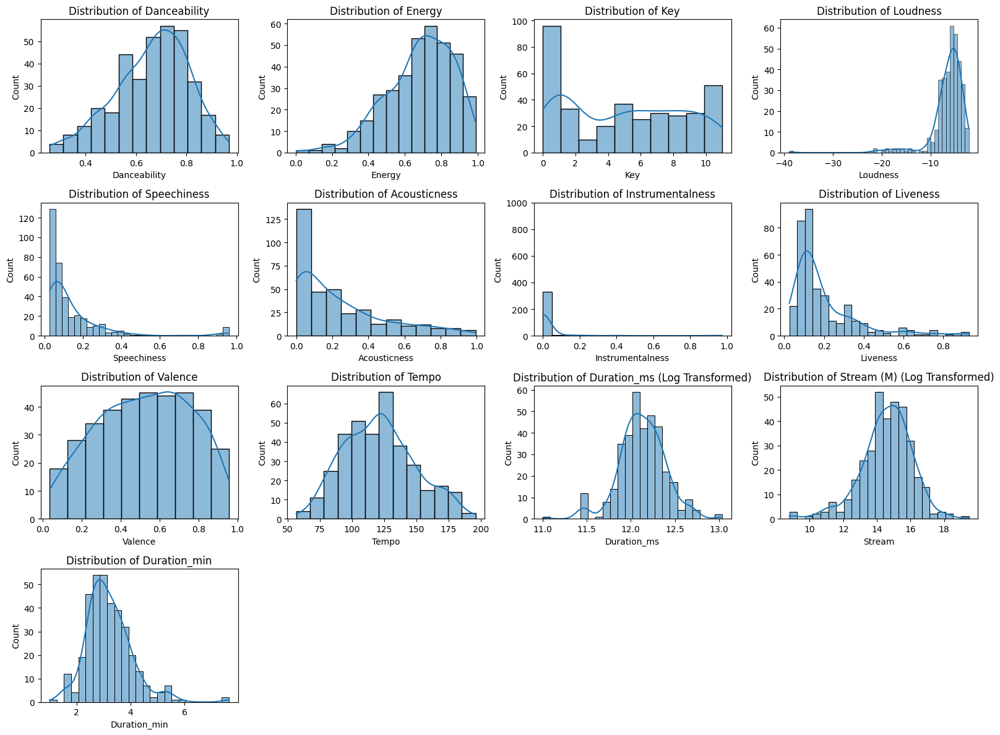

In [112]:
def get_scale_title(col_data, col_name):
    max_val = col_data.max()
    if max_val >= 1e9:
        scale = " (B)"
    elif max_val >= 1e6:
        scale = " (M)"
    else:
        scale = ""
    return f"{col_name}{scale}"

df_numeric = spotify_30_df.select_dtypes(include = ["float64"])


df_log = df_numeric.apply(lambda x: np.log1p(x) if x.max() > 1e5 else x)


plt.figure(figsize = (16, 12))
for i, col in enumerate(df_log, 1):
    plt.subplot(4, 4, i)
    
    
    if col == "Instrumentalness":
        sns.histplot(spotify_30_df[col], kde = True, binwidth = 0.05)
        plt.ylim(0, 1000)
    else:
        sns.histplot(df_log[col], kde = True)
    
    
    title = get_scale_title(df_numeric[col], col)
    plt.title(f"Distribution of {title} (Log Transformed)" if df_numeric[col].max() > 1e5 else f"Distribution of {col}")
    plt.xlabel(col)
    
plt.tight_layout()
plt.show()

Total number of outliers in column Duration_min: 16
Lower limit: 1.1900000000000002, Upper limit: 5.0572333333333335
-----------------------------------------------------------
Total number of outliers in column Tempo: 0
Lower limit: 40.079874999999994, Upper limit: 199.922875
-----------------------------------------------------------
Total number of outliers in column Stream: 37
Lower limit: -5627215.875, Upper limit: 12093371.125
-----------------------------------------------------------


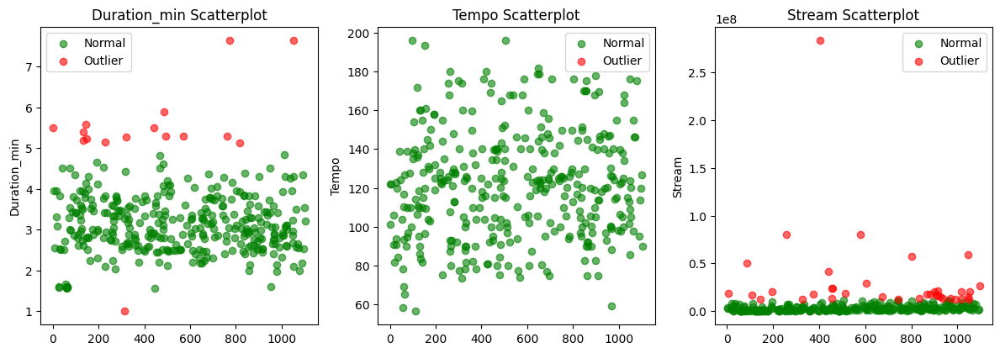

In [114]:

def find_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers, lower_bound, upper_bound


columns_to_check = ["Duration_min","Tempo","Stream"]


plt.figure(figsize = (12, 8))
for i, col in enumerate(columns_to_check, 1):

    outliers, lower, upper = find_outliers_iqr(spotify_30_df, col)

   
    normal_values = spotify_30_df[(spotify_30_df[col] >= lower) & (spotify_30_df[col] <= upper)]

    
    plt.subplot(2, 3, i)
    plt.scatter(normal_values.index, normal_values[col], label = "Normal", alpha = 0.6, c = "green")
    plt.scatter(outliers.index, outliers[col], label = "Outlier", alpha=0.6, c = "red")
    plt.title(f"{col} Scatterplot")
    plt.ylabel(col)
    plt.legend()

    
    print(f"Total number of outliers in column {col}: {len(outliers)}")
    print(f"Lower limit: {lower}, Upper limit: {upper}")
    print("-" * 59)

plt.tight_layout()
plt.show()

C:\Users\Samsung\AppData\Local\Temp\ipykernel_21032\3512931592.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  spotify_30_df.groupby("Energy_group")["Stream"].sum().plot(kind = "bar", color = "midnightblue")
C:\Users\Samsung\AppData\Local\Temp\ipykernel_21032\3512931592.py:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  spotify_30_df.groupby("Valence_group")["Stream"].sum().plot(kind = "bar", color = "maroon")
C:\Users\Samsung\AppData\Local\Temp\ipykernel_21032\3512931592.py:32: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass ob

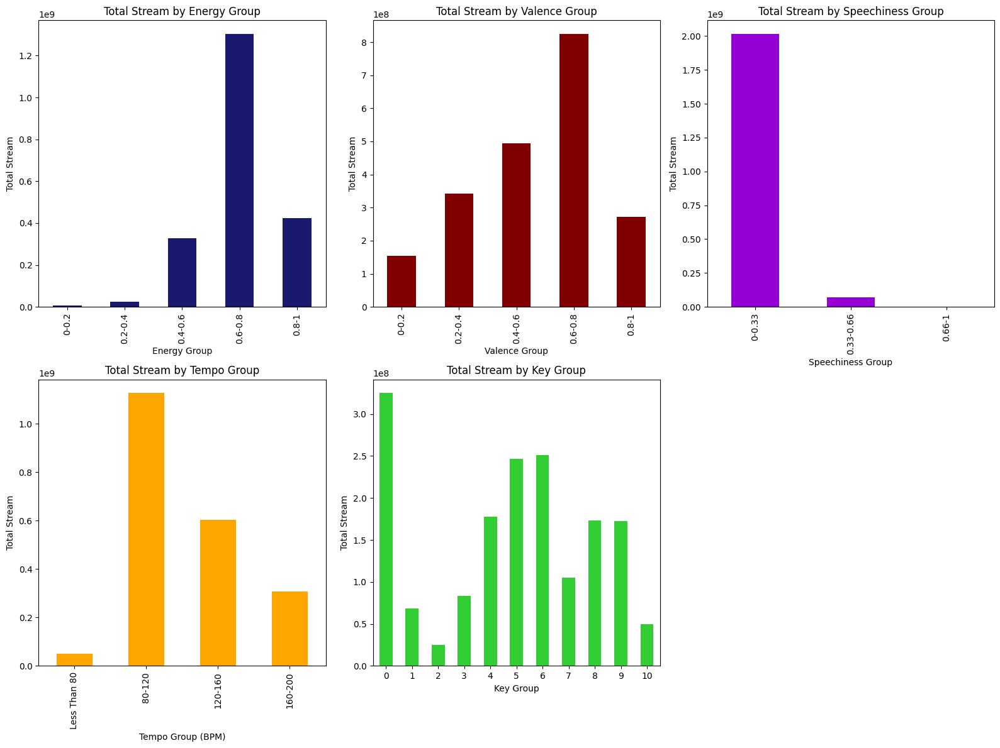

In [117]:
energy_bins = [0, 0.2, 0.4, 0.6, 0.8, 1]
valence_bins = [0, 0.2, 0.4, 0.6, 0.8, 1]
speechiness_bins = [0, 0.33, 0.66, 1]
tempo_bins = [0, 80, 120, 160, 200]

# Grouping the features into bins
spotify_30_df["Energy_group"] = pd.cut(spotify_30_df["Energy"], bins = energy_bins, labels = ["0-0.2", "0.2-0.4", "0.4-0.6", "0.6-0.8", "0.8-1"])
spotify_30_df["Valence_group"] = pd.cut(spotify_30_df["Valence"], bins = valence_bins, labels = ["0-0.2", "0.2-0.4", "0.4-0.6", "0.6-0.8", "0.8-1"])
spotify_30_df["Speechiness_group"] = pd.cut(spotify_30_df["Speechiness"], bins = speechiness_bins, labels = ["0-0.33", "0.33-0.66", "0.66-1"])
spotify_30_df["Tempo_group"] = pd.cut(spotify_30_df["Tempo"], bins = tempo_bins, labels = ["Less Than 80", "80-120", "120-160", "160-200"])
spotify_30_df["Key_group"] = pd.cut(spotify_30_df["Key"], bins = range(0, 12), labels = [f"{i}" for i in range(11)])

# Now that we have done the grouping, let's start visualization
plt.figure(figsize = (16, 12))

# Energy
plt.subplot(2, 3, 1)
spotify_30_df.groupby("Energy_group")["Stream"].sum().plot(kind = "bar", color = "midnightblue")
plt.title("Total Stream by Energy Group")
plt.xlabel("Energy Group")
plt.ylabel("Total Stream")

# Valence
plt.subplot(2, 3, 2)
spotify_30_df.groupby("Valence_group")["Stream"].sum().plot(kind = "bar", color = "maroon")
plt.title("Total Stream by Valence Group")
plt.xlabel("Valence Group")
plt.ylabel("Total Stream")

# Speechiness
plt.subplot(2, 3, 3)
spotify_30_df.groupby("Speechiness_group")["Stream"].sum().plot(kind = "bar", color = "darkviolet")
plt.title("Total Stream by Speechiness Group")
plt.xlabel("Speechiness Group")
plt.ylabel("Total Stream")

# Tempo
plt.subplot(2, 3, 4)
spotify_30_df.groupby("Tempo_group")["Stream"].sum().plot(kind = "bar", color = "orange")
plt.title("Total Stream by Tempo Group")
plt.xlabel("Tempo Group (BPM)")
plt.ylabel("Total Stream")

# Key
plt.subplot(2, 3, 5)
spotify_30_df.groupby("Key_group")["Stream"].sum().plot(kind = "bar", color = "limegreen")
plt.title("Total Stream by Key Group")
plt.xlabel("Key Group")
plt.ylabel("Total Stream")
plt.xticks(rotation = 0)

plt.tight_layout()
plt.show()

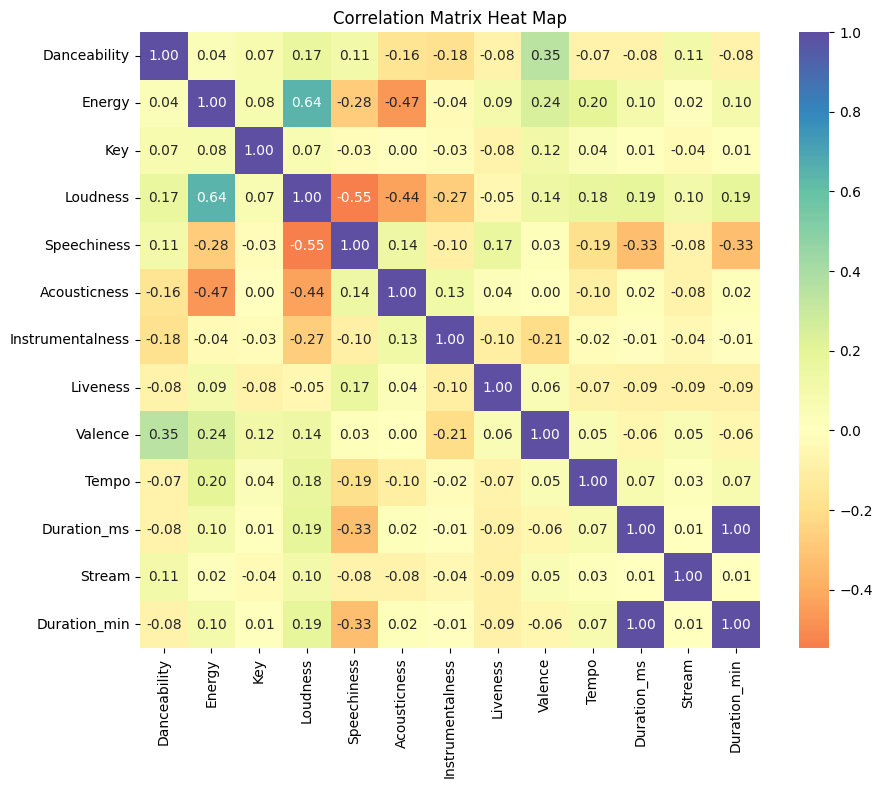

In [118]:
corr_matrix = df_numeric.corr()

plt.figure(figsize = (10,8))
sns.heatmap(corr_matrix, annot = True, cmap = "Spectral", center = 0, fmt = ".2f")
plt.title("Correlation Matrix Heat Map")
plt.show()

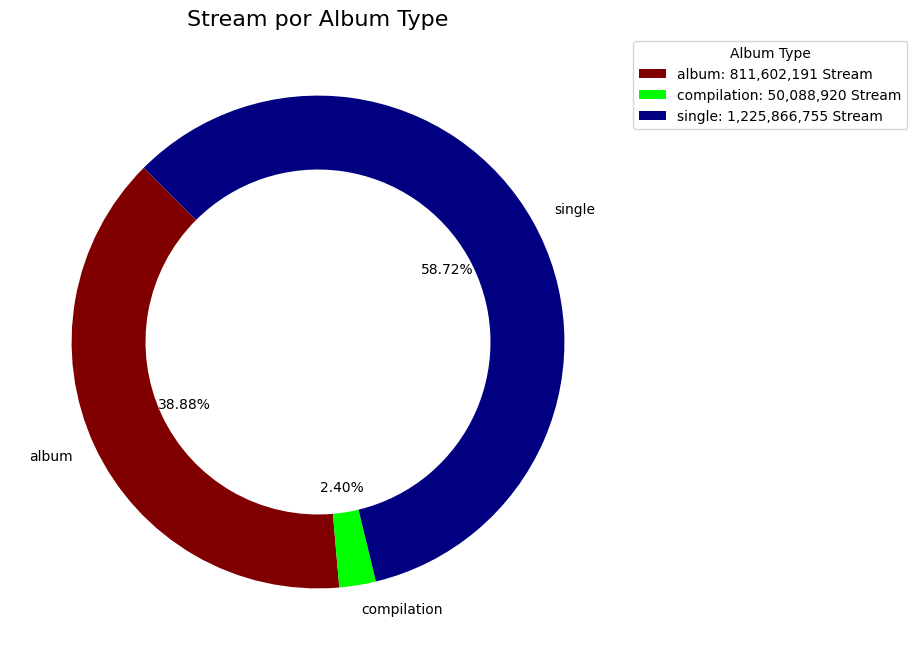

In [119]:
album_views = spotify_30_df.groupby("Album_type")["Stream"].sum()

# Now let's create the Donut Chart.
plt.figure(figsize = (8, 8))

plt.pie(album_views, labels = album_views.index, autopct = "%1.2f%%", startangle = 135, colors = ["maroon", "lime", "navy"], wedgeprops = dict(width = 0.3))
plt.title("Stream por Album Type", fontsize = 16)
plt.legend(labels = [f"{label}: {value:,.0f} Stream" for label, value in zip(album_views.index, album_views)],
           title = "Album Type", loc = "upper left", bbox_to_anchor = (1, 0, 0.5, 1))

In [129]:
spotify_30_df=spotify_30_df[spotify_30_df["Stream"]<12093371.125]

In [130]:
print("Valor maximo de engajamento: ",spotify_30_df.Stream.max())
print("Valor minimo de engajamento: ",spotify_30_df.Stream.min())
print("Valor medio de engajamento: ",spotify_30_df.Stream.mean())
print("Numero de amostras: ",len(spotify_30_df))

Valor maximo de engajamento:  11200338.0
Valor minimo de engajamento:  6574.0
Valor medio de engajamento:  2899047.5936507937
Numero de amostras:  315


In [131]:
spotify_30_df["class_Stream"] = spotify_30_df["Stream"].apply(lambda x: 1 if x >= 2899047 else 0)

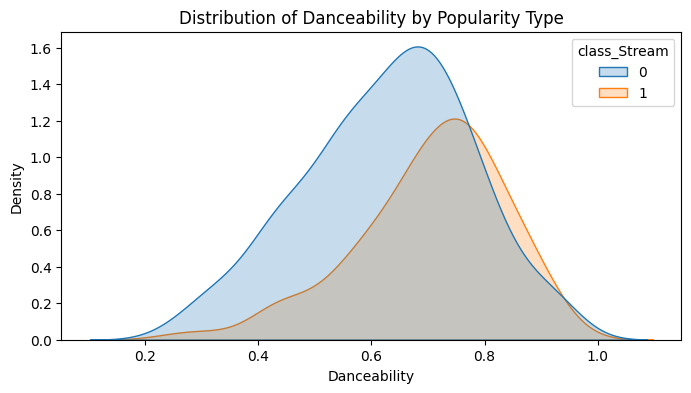

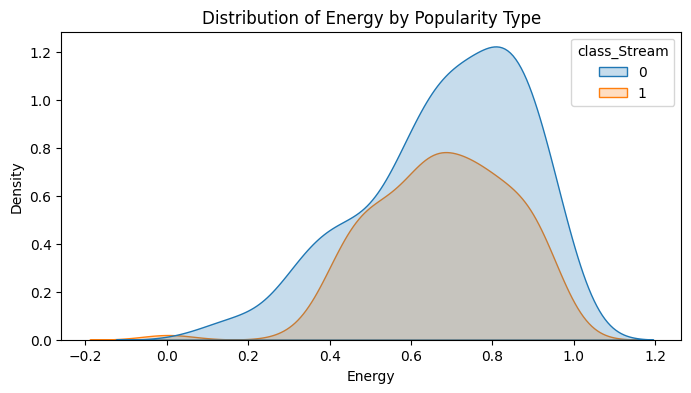

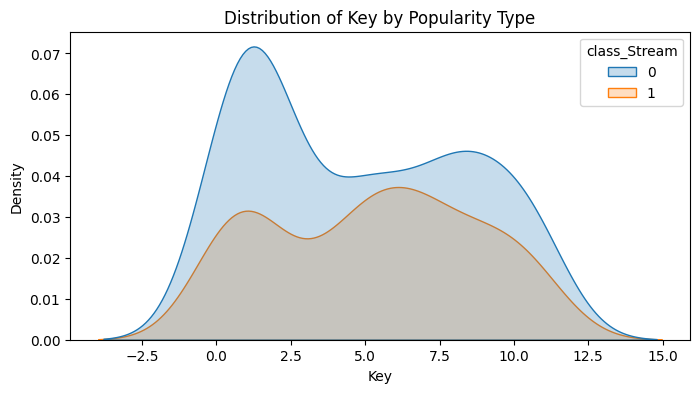

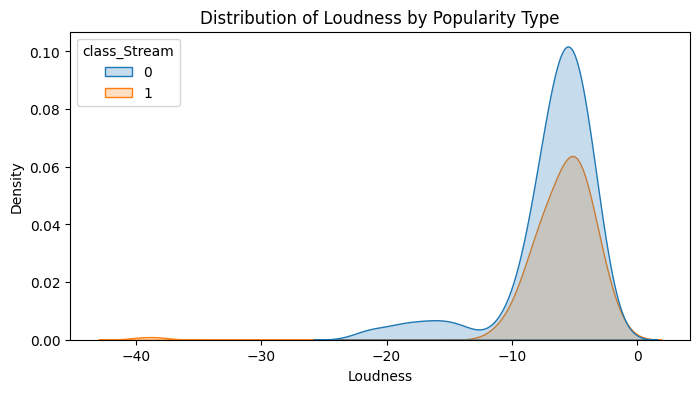

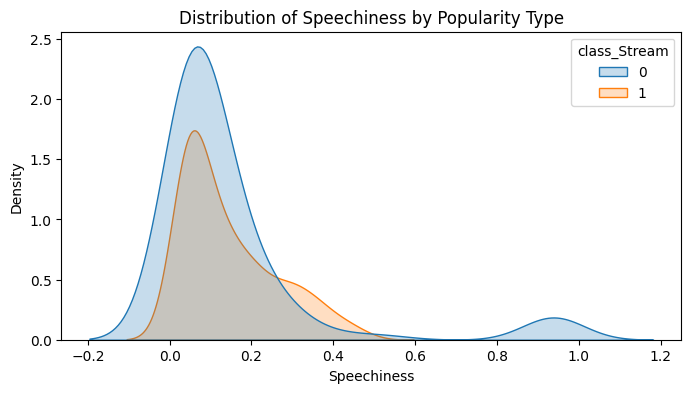

...

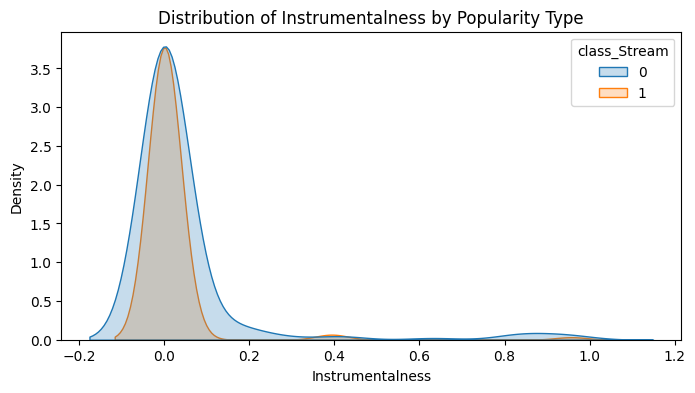

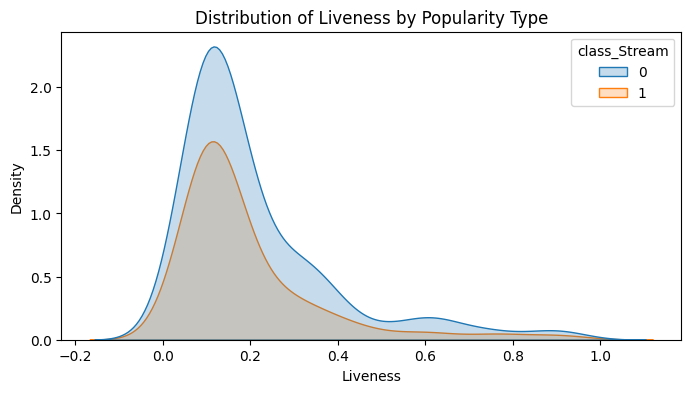

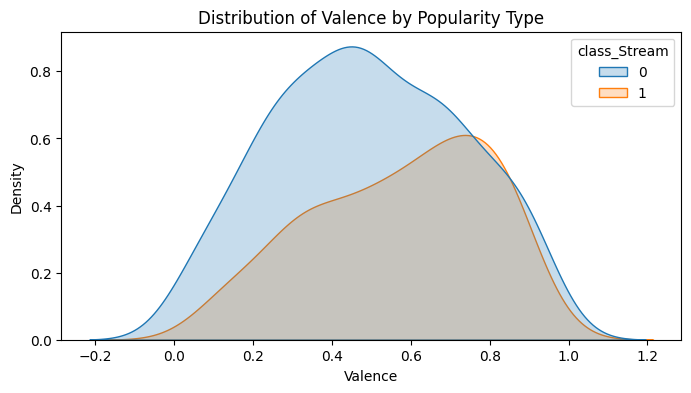

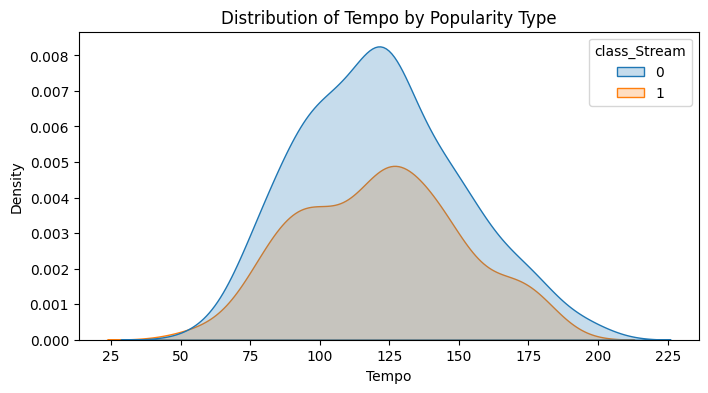

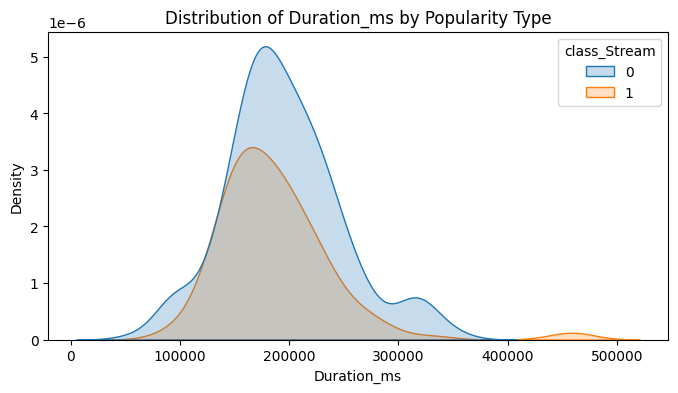

In [132]:
audio_features = ['Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms']
for feature in audio_features:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=spotify_30_df, x=feature, hue='class_Stream', fill=True)
    plt.title(f'Distribution of {feature} by Popularity Type')
    plt.show()

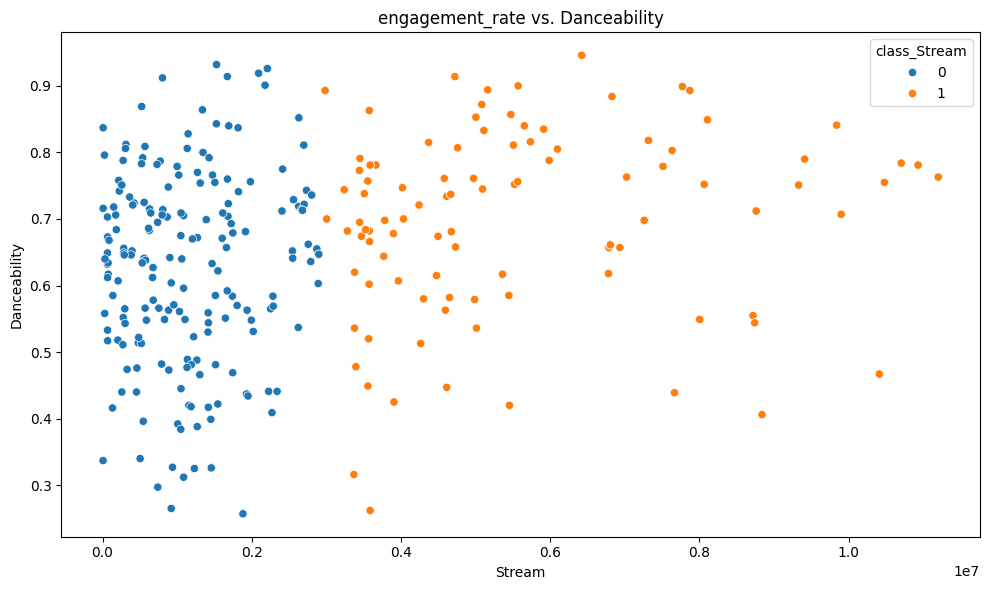

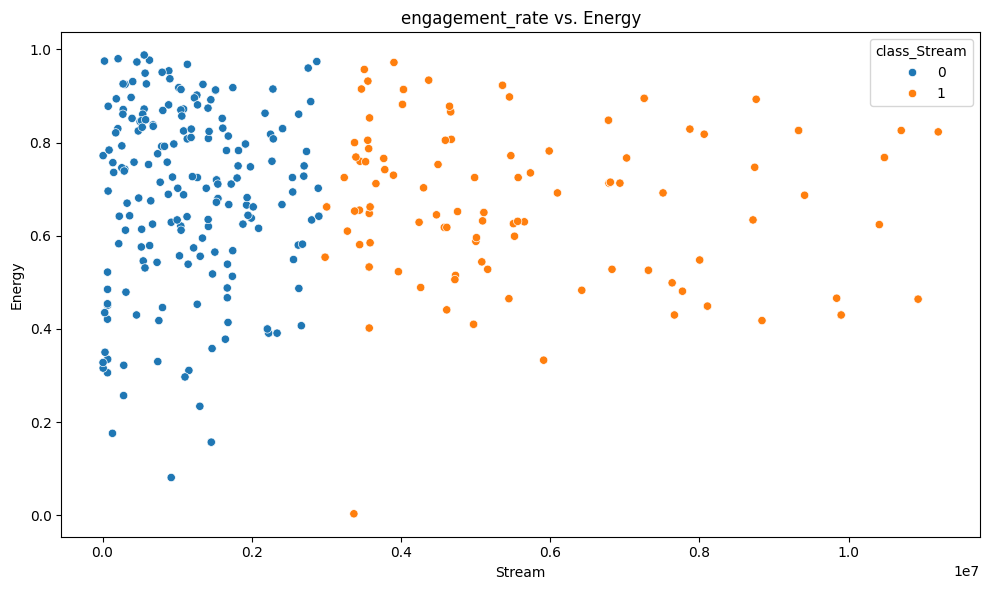

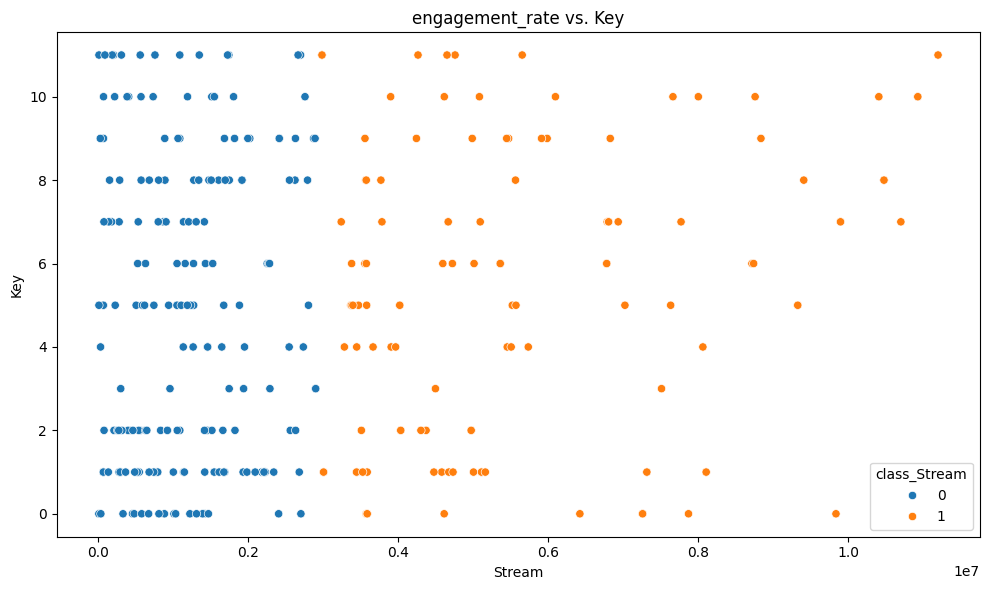

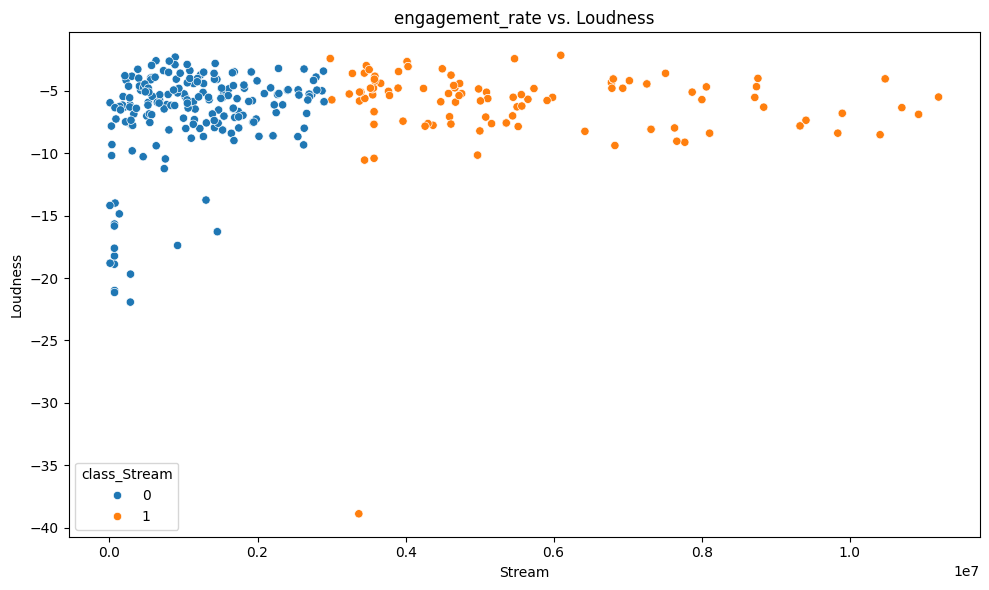

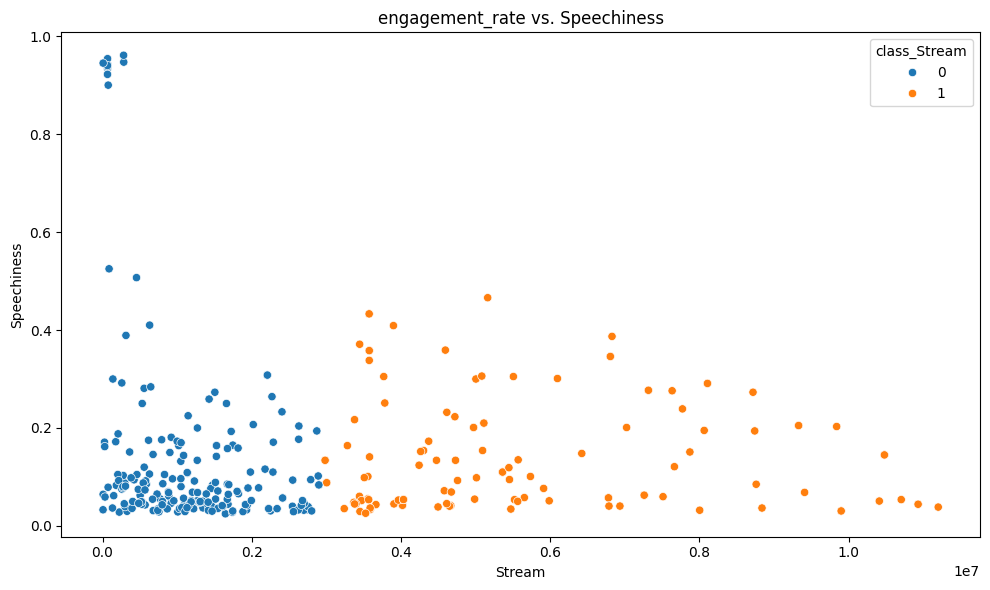

...

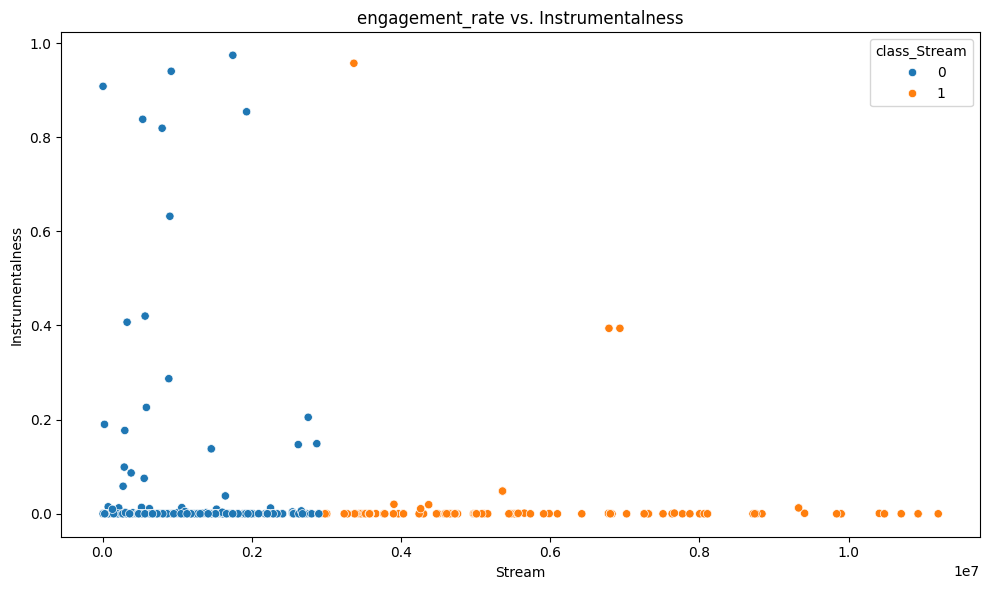

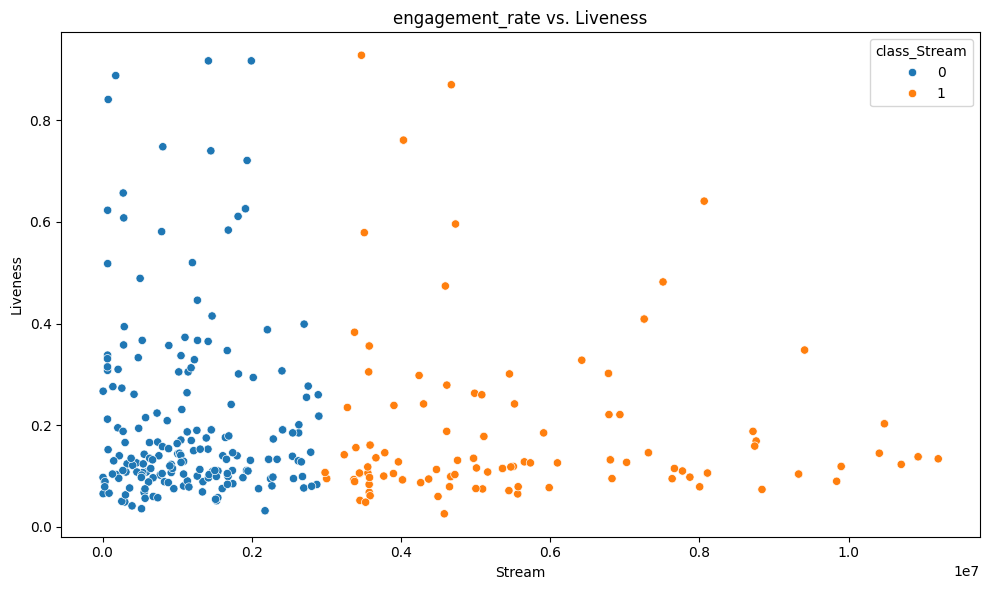

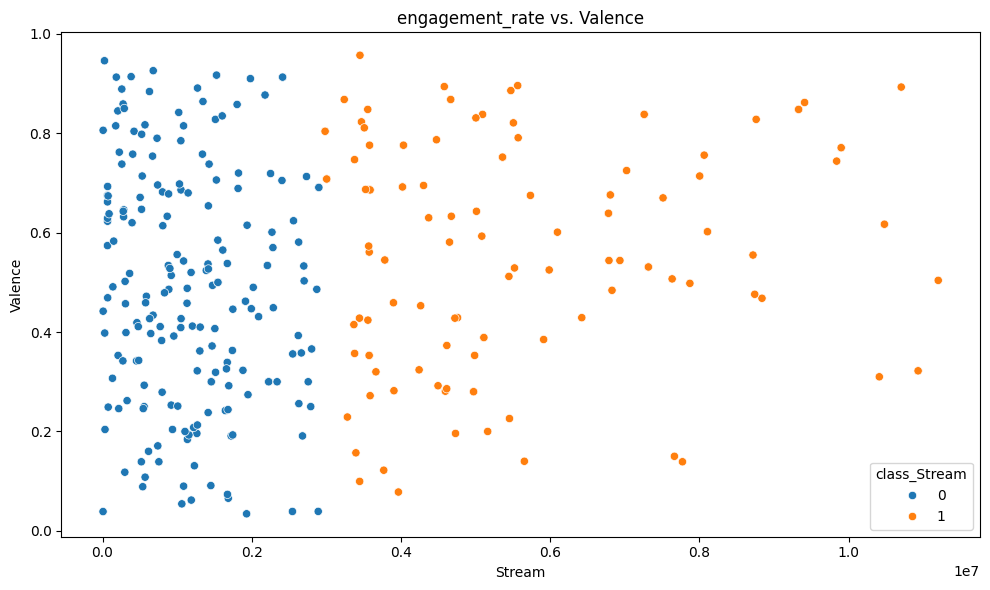

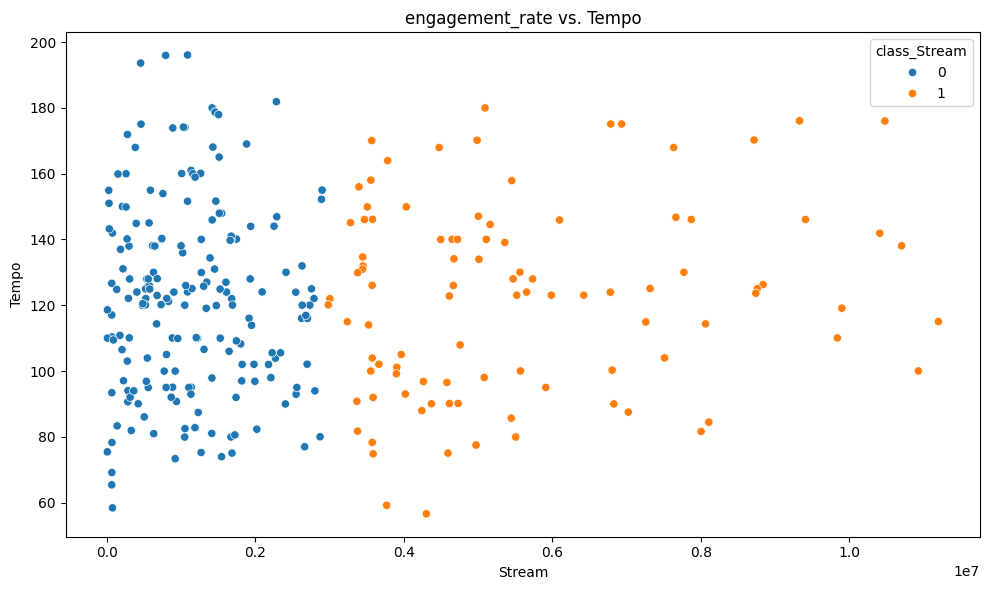

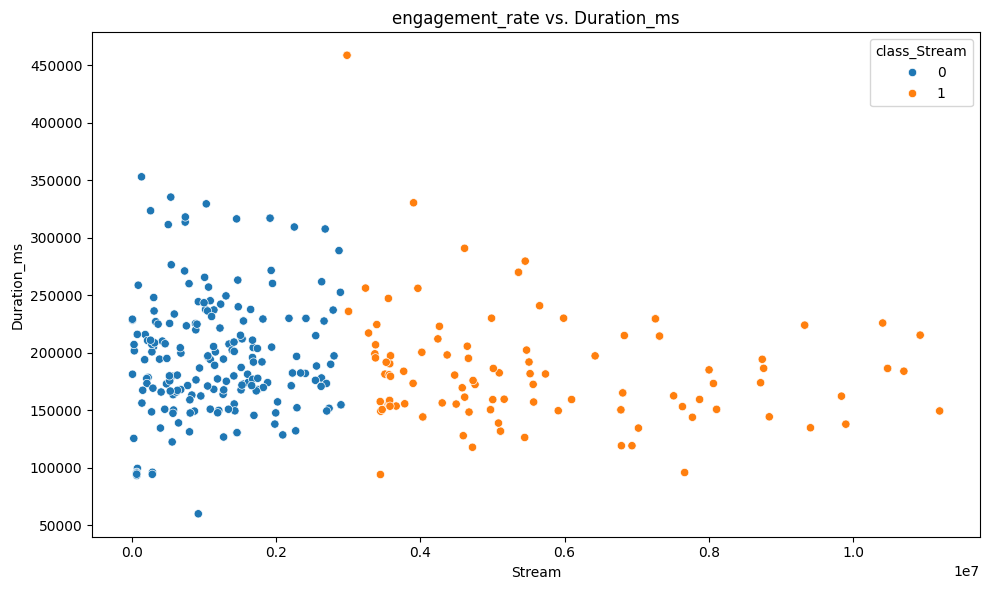

In [125]:
audio_features = ['Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms']

# Plot scatter plots
for feature_y in audio_features:
      plt.figure(figsize=(10, 6))
      sns.scatterplot(data=spotify_30_df, x='Stream', y=feature_y, hue='class_Stream')
      plt.title(f'engagement_rate vs. {feature_y.capitalize()}')
      plt.tight_layout()
      plt.show()

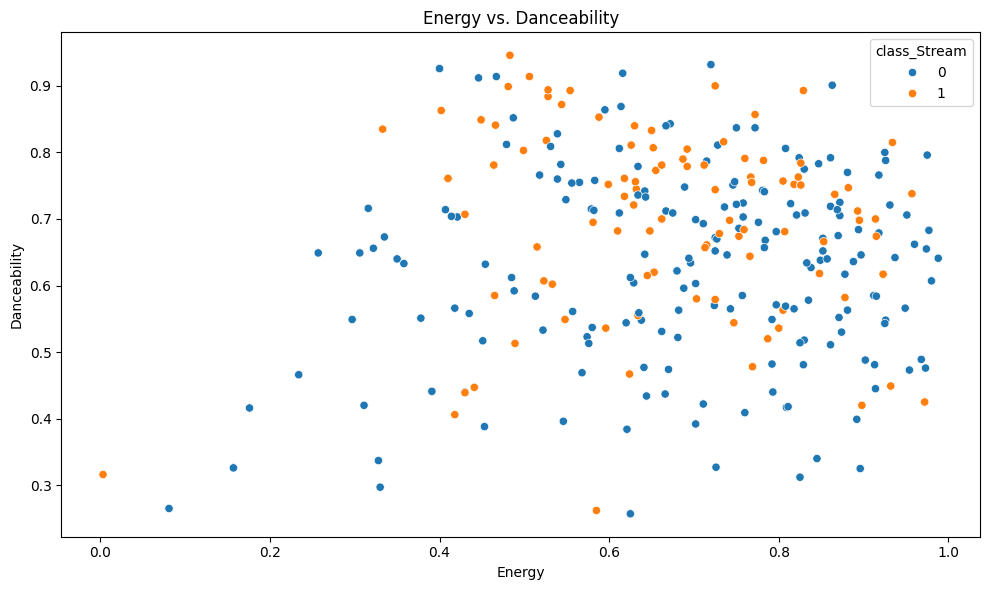

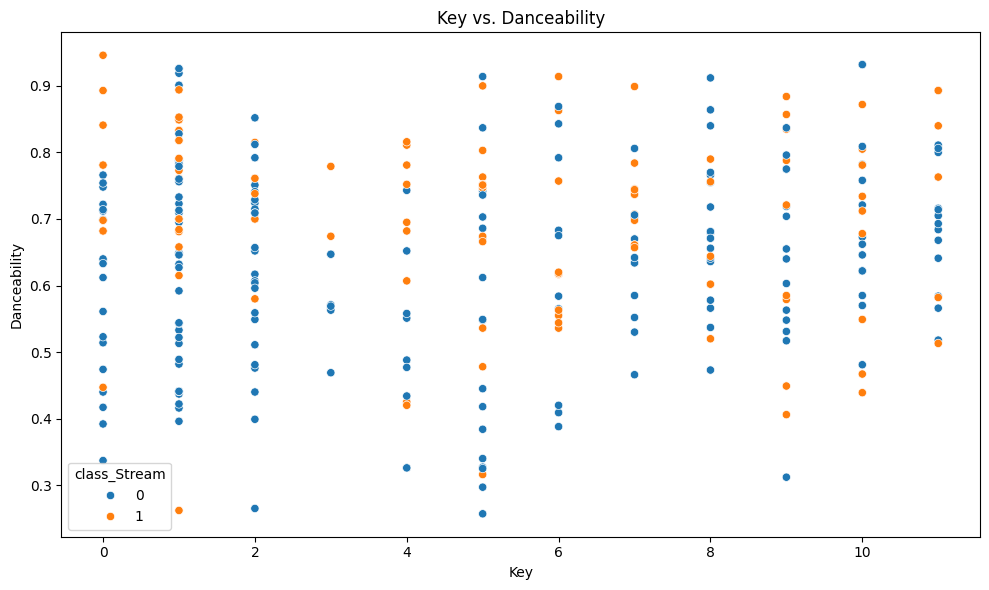

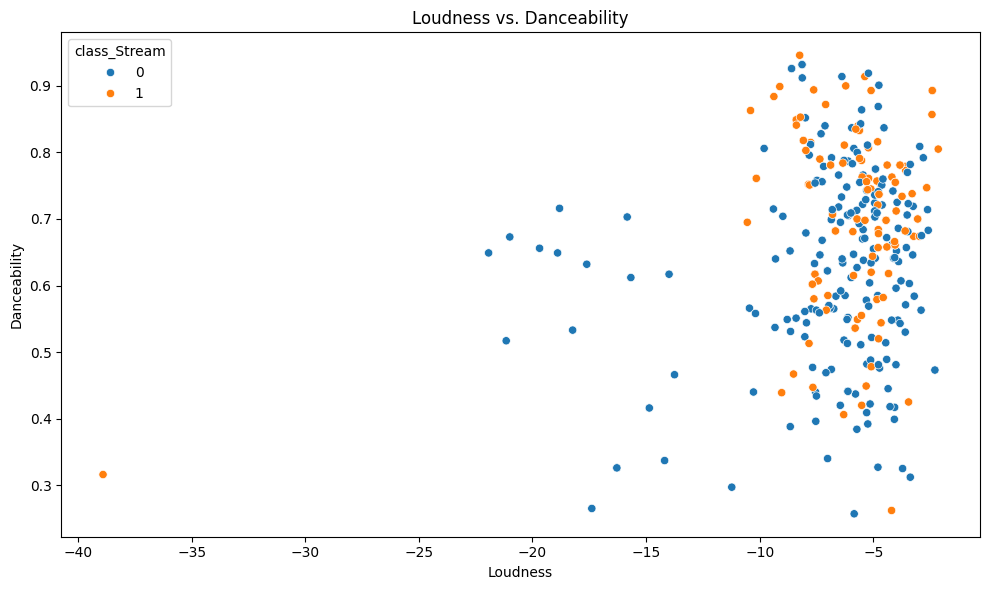

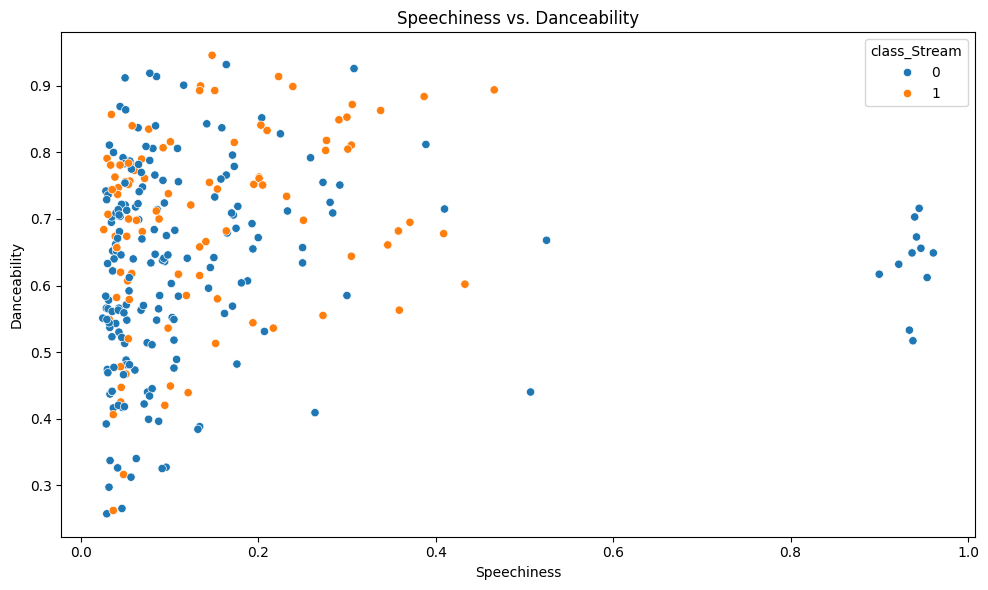

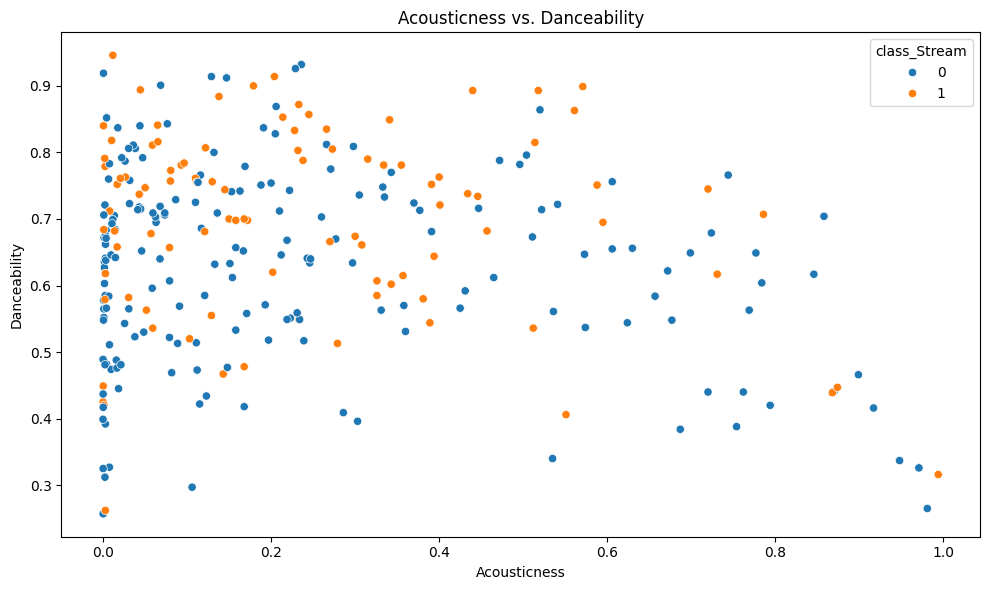

...

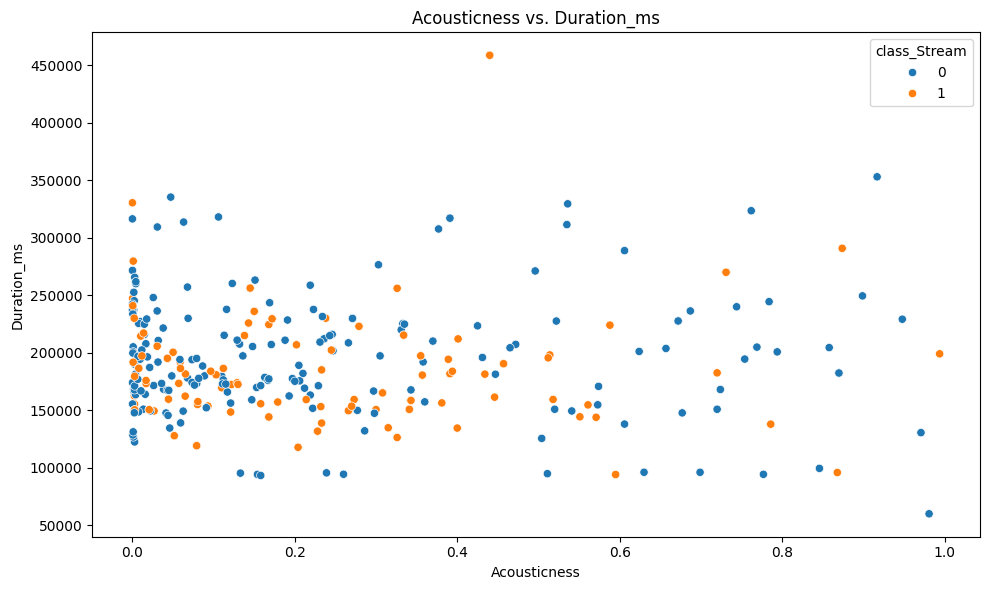

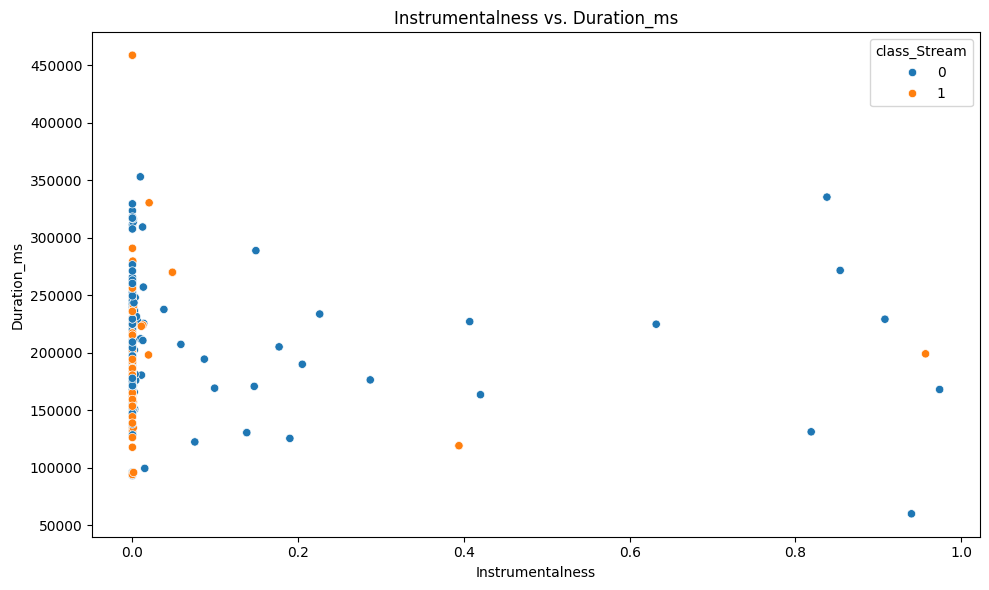

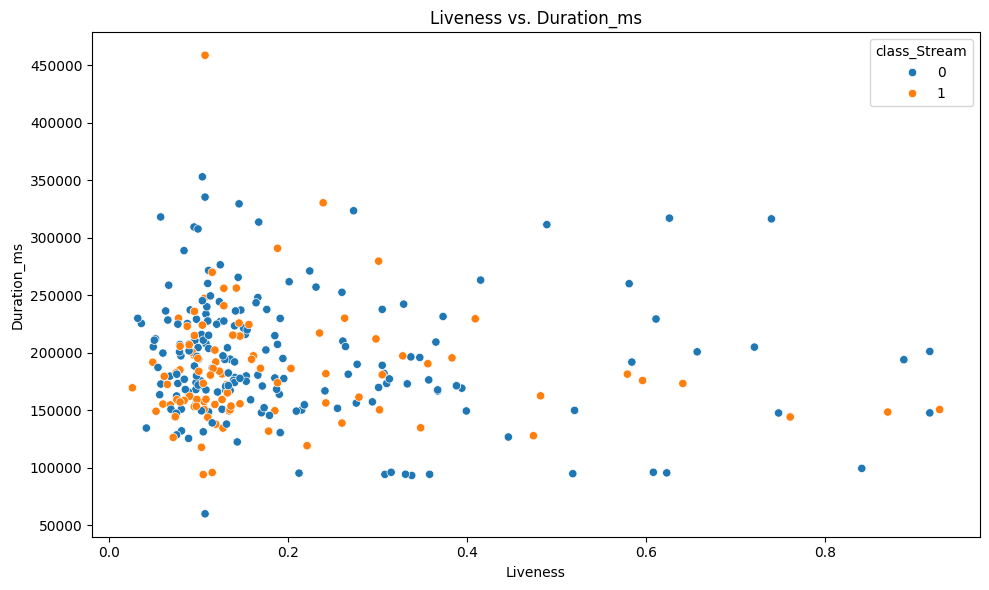

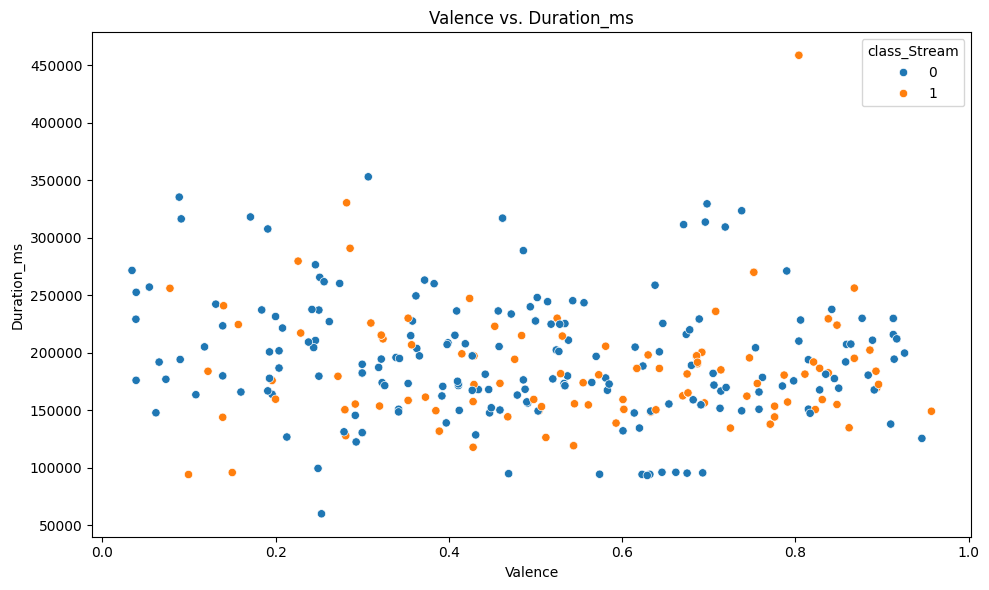

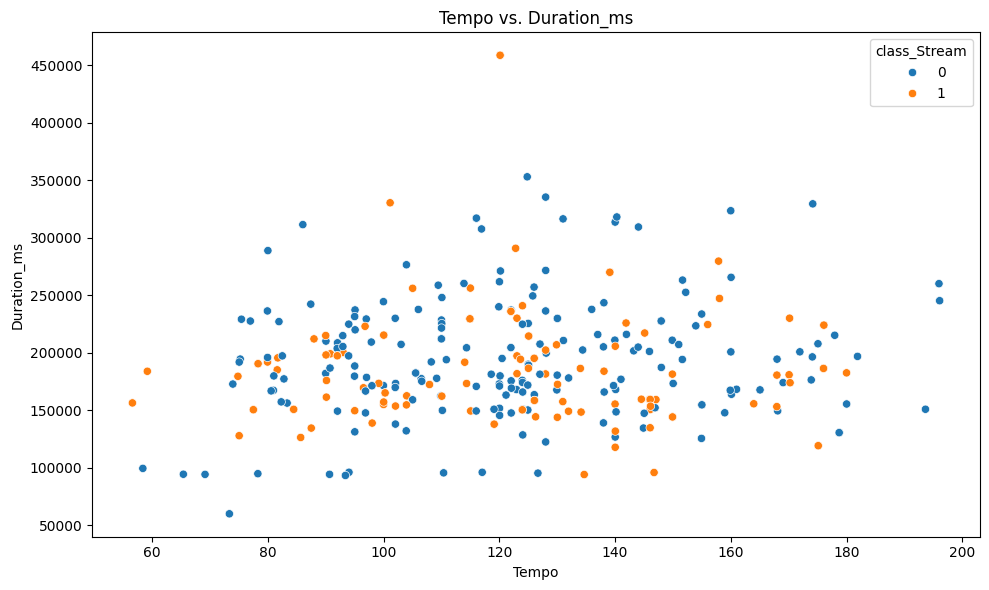

In [ ]:
audio_features = ['Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness','Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo','Duration_ms']

# Plot scatter plots
for feature_y in audio_features:
  for feature_x in audio_features:
    if feature_x != feature_y:
      plt.figure(figsize=(10, 6))
      sns.scatterplot(data=spotify_30_df, x=feature_x, y=feature_y, hue='class_Stream')
      plt.title(f'{feature_x.capitalize()} vs. {feature_y.capitalize()}')
      plt.tight_layout()
      plt.show()